# Мониторинг безопасности одиноких пожилых людей

**Цель** - разработать модель детекции нетипичного поведения для одиноких пожилых людей. Модель будет определять, является ли конкретный час типичным или нет на основании показателей датчиков в этот час. (В перспективе можно развить модель на более частые интервалы или делать наблюдения со скользящим часом). В целом модель (и сервис в целом) можно воспринимать как PoC

**Метрика** - в качестве метрики будет использоваться recall, потому что нам необходимо минимизировать FN (То есть свести к минимому часы, когда модель педсказывает отсутствие анамального поведения, хотя оно присутствует). FP в данном случае будет восприниматься как повод родственикам позвонить пожилому человеку и узнать, все ли в порядке. Понятно, что каждый час звонить и проверять тоже не стоит, но акцент лучше сделать на минимизации FN

**Задачи в этом ноутбуке** - провести EDA, посмотреть на распределение данных и получить более детальное представление о данных. А также подобрать фичи и алгоритмы МО, которые будут использоваться в сервисе

In [1]:
import pandas as pd
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
# Выделим в переменную дату начала нетипичного поведения датчиков (когда никого нет дома)
ANOMALY_START = "2020-01-25"

In [4]:
df = pd.read_csv("data/database_gas.csv")
df["timestamp"] = pd.to_datetime(df["timestamp"]).round('1s').dt.tz_localize(None)
df

,timestamp,temperature,humidity,CO2CosIRValue,CO2MG811Value,MOX1,MOX2,MOX3,MOX4,COValue
0,2019-11-06 11:37:13,19.48,54.86,128.0,563.0,476.0,731.0,649.0,565.0,128.0
1,2019-11-06 11:37:33,19.59,54.23,129.0,563.0,477.0,731.0,649.0,565.0,125.0
2,2019-11-06 11:37:53,19.63,54.05,128.0,566.0,478.0,732.0,649.0,565.0,125.0
3,2019-11-06 11:38:13,19.64,53.74,128.0,566.0,478.0,732.0,649.0,565.0,125.0
4,2019-11-06 11:38:33,19.67,53.53,128.0,569.0,480.0,732.0,650.0,565.0,125.0
...,...,...,...,...,...,...,...,...,...,...
416148,2020-02-13 11:56:54,20.62,57.75,62.0,518.0,524.0,698.0,642.0,591.0,157.0
416149,2020-02-13 11:57:14,20.62,57.75,62.0,518.0,524.0,698.0,641.0,591.0,157.0
416150,2020-02-13 11:57:34,20.62,57.75,62.0,518.0,524.0,698.0,641.0,591.0,157.0
416151,2020-02-13 11:57:54,20.62,57.74,63.0,518.0,524.0,698.0,641.0,591.0,157.0


20 секунд - очень часто и слишком много данных (не удобно визуализировать, строить эмбендинги и тд), сделаем агрегацию - средний показатель за 10 мин и будем работать с ней

In [5]:
df = df.groupby(pd.Grouper(key="timestamp", freq="10min")).agg("mean").reset_index()
df

,timestamp,temperature,humidity,CO2CosIRValue,CO2MG811Value,MOX1,MOX2,MOX3,MOX4,COValue
0,2019-11-06 11:30:00,19.632222,53.832222,127.666667,567.444444,479.666667,732.222222,649.555556,565.111111,124.000000
1,2019-11-06 11:40:00,19.639667,53.970000,128.600000,579.800000,496.366667,731.500000,649.533333,565.433333,114.700000
2,2019-11-06 11:50:00,19.993333,49.446000,102.300000,600.033333,528.766667,760.166667,700.600000,611.666667,106.533333
3,2019-11-06 12:00:00,19.963333,47.408333,80.500000,615.033333,557.733333,781.266667,737.133333,656.900000,100.266667
4,2019-11-06 12:10:00,19.417667,48.102333,77.033333,619.633333,567.366667,787.433333,749.600000,676.933333,95.866667
...,...,...,...,...,...,...,...,...,...,...
14254,2020-02-13 11:10:00,20.654000,57.908667,43.033333,518.166667,525.833333,700.500000,643.800000,594.633333,156.633333
14255,2020-02-13 11:20:00,20.598333,58.131667,42.533333,518.000000,527.500000,701.133333,643.866667,594.300000,155.733333
14256,2020-02-13 11:30:00,20.590333,58.085667,42.833333,517.966667,526.100000,699.933333,642.800000,592.466667,155.600000
14257,2020-02-13 11:40:00,20.590000,57.969000,46.100000,517.633333,524.733333,699.000000,642.000000,591.533333,156.133333


In [6]:
measurements = ["temperature", "humidity", "CO2CosIRValue", "CO2MG811Value", "MOX1", "MOX2", "MOX3", "MOX4", "COValue"]

# Визуализация и гипотезы

In [7]:
fig = px.line(df, x="timestamp", y=measurements)
fig.add_vline(ANOMALY_START, line_width=3, line_dash="dash", line_color="black")
fig.show()

Видно, что после 2020-01-25 поведение датчиков сильно изменяется. Все данные, правее от пунктирной линии можно использовать как нетипичные при обучении.

Кроме того, в типичном периоде ярко выражены паттерны в течении дня - на основе этих паттернов можно и научиться понимать, типичный день или нет.

Конечно, во временных рядах присутствует некоторая тенденция (возможно), но в силу того, что разделение классов строго по времени - придется отказаться от временной структцры. Будем рассматривать каждый час как отдельное наблюдение. Кроме того, наблюдения нужно обязательно перемешать, чтобы избежать автокорреляции данных.

В качестве фичей можно использовать временную структуру как эмбендинг - наблюдение за первые 10 минут часа, наблюдение за 2 десять минут часа и тд.

In [7]:
df["anomaly"] = (df["timestamp"] >= ANOMALY_START).astype(int)
df

,timestamp,temperature,humidity,CO2CosIRValue,CO2MG811Value,MOX1,MOX2,MOX3,MOX4,COValue,anomaly
0,2019-11-06 11:30:00,19.632222,53.832222,127.666667,567.444444,479.666667,732.222222,649.555556,565.111111,124.000000,0
1,2019-11-06 11:40:00,19.639667,53.970000,128.600000,579.800000,496.366667,731.500000,649.533333,565.433333,114.700000,0
2,2019-11-06 11:50:00,19.993333,49.446000,102.300000,600.033333,528.766667,760.166667,700.600000,611.666667,106.533333,0
3,2019-11-06 12:00:00,19.963333,47.408333,80.500000,615.033333,557.733333,781.266667,737.133333,656.900000,100.266667,0
4,2019-11-06 12:10:00,19.417667,48.102333,77.033333,619.633333,567.366667,787.433333,749.600000,676.933333,95.866667,0
...,...,...,...,...,...,...,...,...,...,...,...
14254,2020-02-13 11:10:00,20.654000,57.908667,43.033333,518.166667,525.833333,700.500000,643.800000,594.633333,156.633333,1
14255,2020-02-13 11:20:00,20.598333,58.131667,42.533333,518.000000,527.500000,701.133333,643.866667,594.300000,155.733333,1
14256,2020-02-13 11:30:00,20.590333,58.085667,42.833333,517.966667,526.100000,699.933333,642.800000,592.466667,155.600000,1
14257,2020-02-13 11:40:00,20.590000,57.969000,46.100000,517.633333,524.733333,699.000000,642.000000,591.533333,156.133333,1


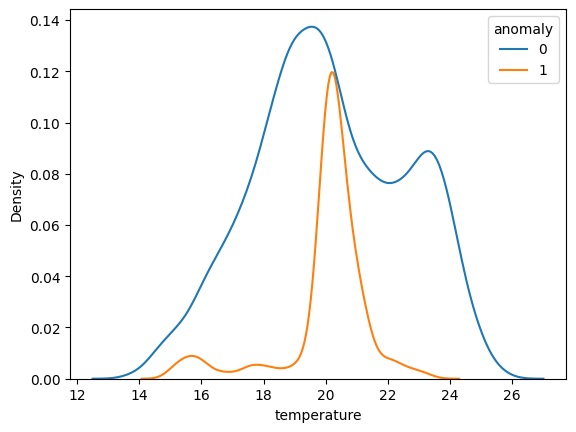

In [8]:
sns.kdeplot(df, x="temperature", hue="anomaly");

Заметно, что распределения в целом отличаются для типичного и нетипичного периода (температура - пример). Но и в течении типичного периода распределение тоже сильно отличается.

<Axes: xlabel='temperature', ylabel='Density'>

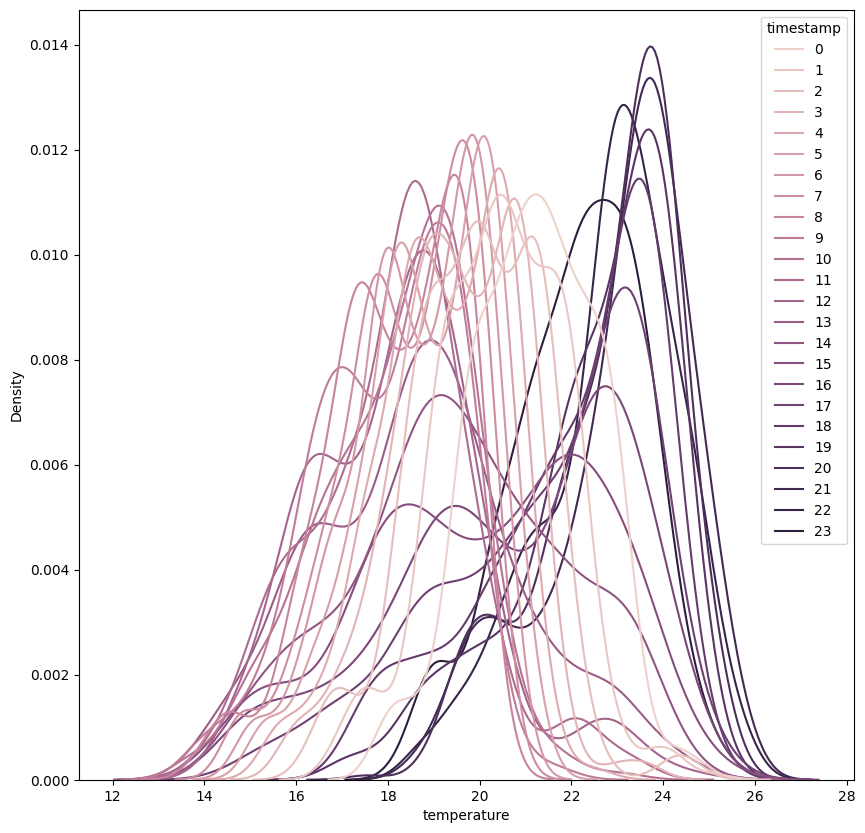

In [9]:
# Рассмотрим, распределение для каждого часа для температуры для типичного периода. 
plt.figure(figsize=(10, 10))
sns.kdeplot(df.query("timestamp < @ANOMALY_START"), x="temperature", hue=df["timestamp"].dt.hour)

Поэтому необходимо для каждого наблюдения указать час, в который происходит наблюдение (причем с помощью кодирования, потоу что связь нелинейная)

Изучим визуально можно просто зная среднее измерение за час понять, является ли час аномальным

In [10]:
df_hour_agg = df.groupby(pd.Grouper(key="timestamp", freq="1H")).agg("mean")
df_hour_agg

,temperature,humidity,CO2CosIRValue,CO2MG811Value,MOX1,MOX2,MOX3,MOX4,COValue,anomaly
timestamp,,,,,,,,,,
2019-11-06 11:00:00,19.755074,52.416074,119.522222,582.425926,501.600000,741.296296,666.562963,580.737037,115.077778,0.0
2019-11-06 12:00:00,19.533222,49.122222,80.866667,617.844444,555.238889,776.822222,731.605556,653.811111,94.527778,0.0
2019-11-06 13:00:00,19.699111,51.239833,84.727778,616.772222,530.872222,760.505556,705.661111,622.116667,95.533333,0.0
2019-11-06 14:00:00,20.202778,49.903167,81.994444,618.461111,427.705556,757.966667,707.561111,625.294444,111.450000,0.0
2019-11-06 15:00:00,20.311944,50.692444,85.977778,615.988889,385.505556,753.555556,702.250000,621.472222,107.855556,0.0
...,...,...,...,...,...,...,...,...,...,...
2020-02-13 07:00:00,20.275222,58.441167,43.233333,518.155556,528.961111,703.366667,646.855556,599.111111,148.238889,1.0
2020-02-13 08:00:00,20.341500,58.252778,42.883333,518.011111,530.033333,704.350000,647.744444,600.761111,149.438889,1.0
2020-02-13 09:00:00,20.396167,57.806222,42.988889,518.072222,530.455556,705.305556,649.083333,601.194444,148.750000,1.0


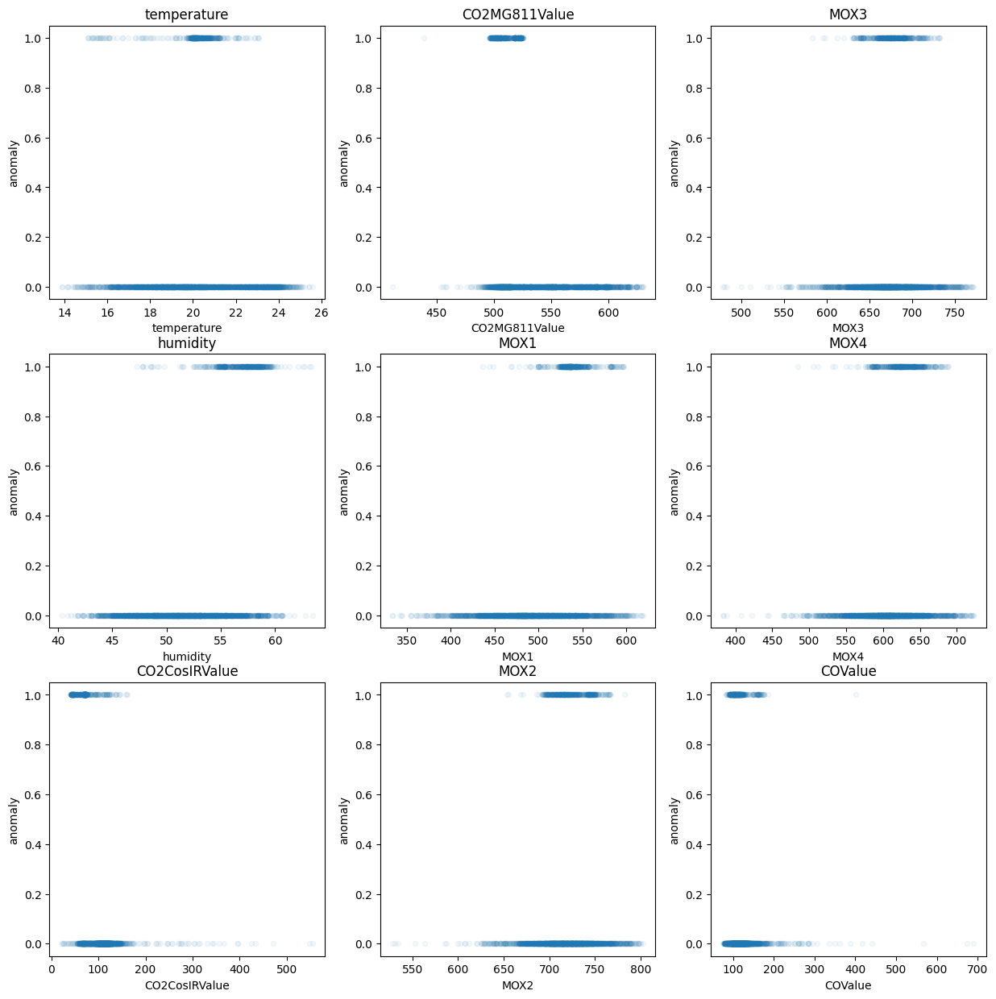

In [11]:
fig, ax = plt.subplots(3, 3, figsize=(15, 15))
for i in range(3):
    for j in range(3):
        df_hour_agg.plot(x=measurements[i+j*3], y="anomaly", ax=ax[i][j], kind="scatter", alpha=0.05, title=measurements[i+j*3])

Кажется, что построить четкую разделительную прямую нельзя. Посмотрим, может быть комбинация средних значений 

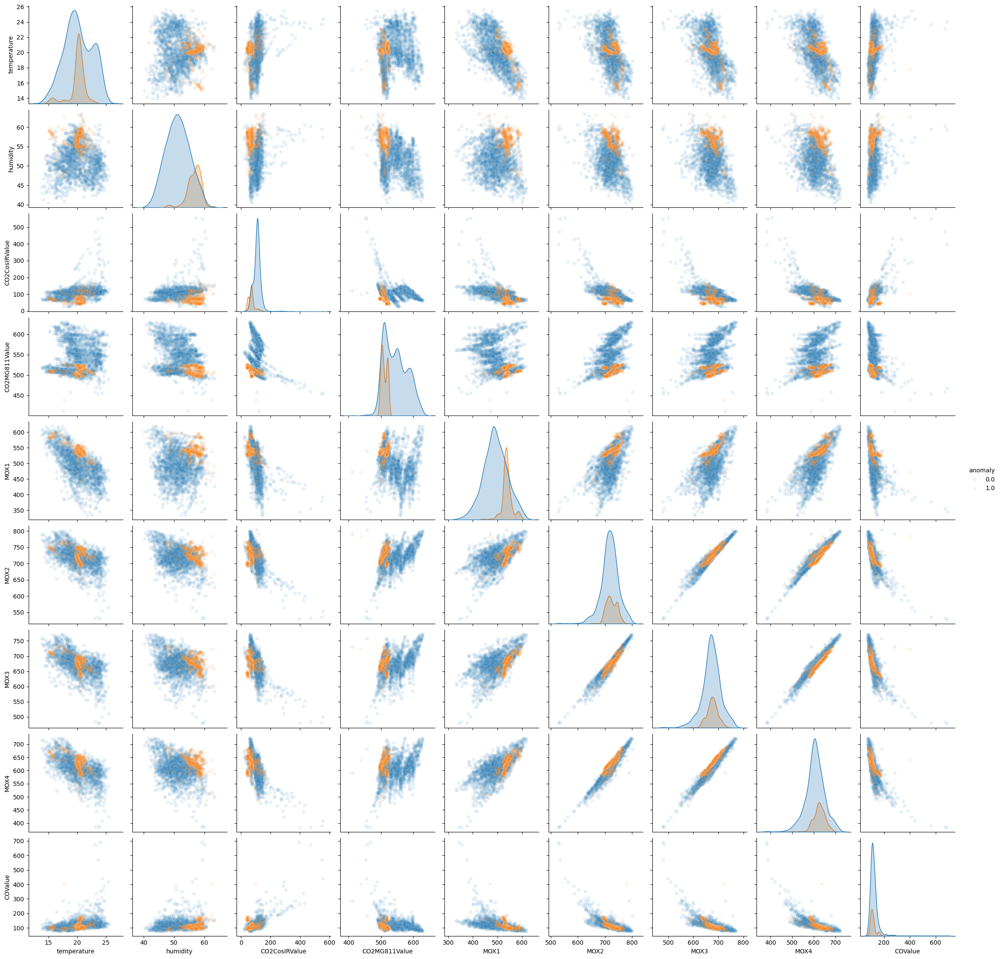

In [12]:
sns.pairplot(df_hour_agg, hue="anomaly", plot_kws={"alpha": 0.1});

Кажется, что несколько получше и более разделимы. Возможно комбинация из всех наблюдений может помочь. Нужно обязаткльно учитывать час. Это уже можно попробовать на этапе экспериментов с моделями.

# 2. Эксперименты с моделями

*Гипотеза 1* - Средние наблюдения за час и указатель часа справятся с задачей

In [13]:
from sklearn.model_selection import cross_val_score, ShuffleSplit
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer

In [14]:
df_hour_agg["anomaly"] = df_hour_agg["anomaly"].astype(int)
df_hour_agg["hour"] = df_hour_agg.index.hour
df_hour_agg = df_hour_agg.dropna()
df_hour_agg

,temperature,humidity,CO2CosIRValue,CO2MG811Value,MOX1,MOX2,MOX3,MOX4,COValue,anomaly,hour
timestamp,,,,,,,,,,,
2019-11-06 11:00:00,19.755074,52.416074,119.522222,582.425926,501.600000,741.296296,666.562963,580.737037,115.077778,0,11
2019-11-06 12:00:00,19.533222,49.122222,80.866667,617.844444,555.238889,776.822222,731.605556,653.811111,94.527778,0,12
2019-11-06 13:00:00,19.699111,51.239833,84.727778,616.772222,530.872222,760.505556,705.661111,622.116667,95.533333,0,13
2019-11-06 14:00:00,20.202778,49.903167,81.994444,618.461111,427.705556,757.966667,707.561111,625.294444,111.450000,0,14
2019-11-06 15:00:00,20.311944,50.692444,85.977778,615.988889,385.505556,753.555556,702.250000,621.472222,107.855556,0,15
...,...,...,...,...,...,...,...,...,...,...,...
2020-02-13 07:00:00,20.275222,58.441167,43.233333,518.155556,528.961111,703.366667,646.855556,599.111111,148.238889,1,7
2020-02-13 08:00:00,20.341500,58.252778,42.883333,518.011111,530.033333,704.350000,647.744444,600.761111,149.438889,1,8
2020-02-13 09:00:00,20.396167,57.806222,42.988889,518.072222,530.455556,705.305556,649.083333,601.194444,148.750000,1,9


In [15]:
# Выборка не сбалансированная, возможно, нужно что-то с этим будет делать
df_hour_agg["anomaly"].value_counts()

anomaly
0    1896
1     423
Name: count, dtype: int64

In [16]:
X = df_hour_agg.drop("anomaly", axis=1).to_numpy()
y = df_hour_agg["anomaly"].to_numpy()

In [17]:
X.shape

(2319, 10)

In [18]:
# Для кодировки часов
ct = ColumnTransformer([("one_hot_encoder", OneHotEncoder(sparse_output=False), [-1])], remainder='passthrough')

In [19]:
# Сразу преобразуем для простоты. В дальнейшем это войдет в моедль
X = ct.fit_transform(X)

In [20]:
X.shape

(2319, 33)

In [21]:
# Для чистоты эксперимента
cv = ShuffleSplit(n_splits=10, test_size=0.3, random_state=1)

In [22]:
cvs = cross_val_score(LogisticRegression(max_iter=5000), X, y, scoring="recall", cv=cv)
cvs.mean(), cvs.std()

(0.9471752715419077, 0.02474078878850741)

In [23]:
cvs = cross_val_score(GradientBoostingClassifier(), X, y, scoring="recall", cv=cv)
cvs.mean(), cvs.std()

(0.952049610516748, 0.011608661784955796)

In [24]:
cvs = cross_val_score(KNeighborsClassifier(n_neighbors=1), X, y, scoring="recall", cv=cv)
cvs.mean(), cvs.std()

(0.9582072346150061, 0.013749610418523898)

In [25]:
clf = make_pipeline(StandardScaler(), LogisticRegression())
cvs = cross_val_score(clf, X, y, scoring="recall", cv=cv)
cvs.mean(), cvs.std()

(0.9317810078582154, 0.021656524960577645)

In [26]:
clf = make_pipeline(PCA(9), LogisticRegression(max_iter=5000))
cvs = cross_val_score(clf, X, y, scoring="recall", cv=cv)
cvs.mean(), cvs.std()

(0.9494610985588189, 0.025084256315071565)

In [27]:
clf = make_pipeline(StandardScaler(), KNeighborsClassifier(n_neighbors=1))
cvs = cross_val_score(clf, X, y, scoring="recall", cv=cv)
cvs.mean(), cvs.std()

(0.8526500107916615, 0.030890518699545975)

In [28]:
clf = make_pipeline(PCA(9), KNeighborsClassifier(n_neighbors=1))
cvs = cross_val_score(clf, X, y, scoring="recall", cv=cv)
cvs.mean(), cvs.std()

(0.9582072346150061, 0.013749610418523898)

В целом, кажется что получился хороший результат, который не получится сильно улучшить, подбирая гипперпараметры. Наблюдения, оцененные как типичные в нетипичном  в будущем необходимо изучить отдельно. Данные модели (например KNN и GB можно взять в сервис). Пока перейдем к следущей гипотезе. 

**Гипотеза 2** - введение эмбендингов временного ряда может улучшить ситуацию
В качестве эмбендингов - разбиение часа на интервалы по 10 минут. Так будет больше фичей и больше шансов поймать закономерности

In [29]:
ds = df.copy(deep=True)
ds["ten_min"] = ds["timestamp"].dt.minute//10
ds["hour"] = ds["timestamp"].dt.hour
ds["date"] = ds["timestamp"].dt.normalize()
ds = ds.pivot(index=["date", "hour"], columns="ten_min", values=measurements)
ds = ds.reset_index(1)
ds = ds.dropna()
ds

hour temperature                                              \
ten_min                   0          1          2          3          4   
date                                                                      
2019-11-06   12   19.963333  19.417667  19.202667  19.509333  19.588667   
2019-11-06   13   19.841667  19.559000  19.755333  19.338333  19.589333   
2019-11-06   14   20.363333  19.996667  19.967333  20.263667  20.322000   
2019-11-06   15   20.411000  20.309667  20.390667  20.491667  20.311667   
2019-11-06   16   19.692667  19.698333  19.521000  19.356000  19.205862   
...         ...         ...        ...        ...        ...        ...   
2020-02-13    7   20.240667  20.167333  20.233333  20.250333  20.211333   
2020-02-13    8   20.583667  20.521667  20.402000  20.252000  20.156333   
2020-02-13    9   20.175667  20.166667  20.439333  20.563333  20.526667   
2020-02-13   10   20.452333  20.461667  20.296667  20.251333  20.177667   
2020-02-13   11   20.657333  20.654000  20.598333  20.590333  20.590000   

                        humidity                        ...        MOX4  \
ten_min             5          0          1          2  ...           2   
date                                                    ...               
2019-11-06  19.517667  47.408333  48.102333  49.129000  ...  682.133333   
2019-11-06  20.111000  50.347667  51.404667  51.433333  ...  614.633333   
2019-11-06  20.303667  50.632333  51.283000  50.146667  ...  624.800000   
2019-11-06  19.957000  49.413667  50.254667  50.442333  ...  621.266667   
2019-11-06  19.621333  52.962333  52.921667  53.479333  ...  618.133333   
...               ...        ...        ...        ...  ...         ...   
2020-02-13  20.548333  58.810333  58.815000  58.472000  ...  600.000000   
2020-02-13  20.133333  57.904333  57.984000  58.196000  ...  600.900000   
2020-02-13  20.505333  58.188667  58.098333  57.699333  ...  601.500000   
2020-02-13  20.386000  57.588667  57.612333  57.989667  ...  597.100000   
2020-02-13  20.672000  57.638000  57.908667  58.131667  ...  594.300000   

                                                   COValue              \
ten_min              3           4           5           0           1   
date                                                                     
2019-11-06  652.833333  631.900000  622.166667  100.266667   95.866667   
2019-11-06  624.300000  632.733333  626.466667   94.100000   94.866667   
2019-11-06  635.900000  638.500000  631.366667   98.400000  107.800000   
2019-11-06  617.066667  620.300000  621.200000  111.500000  107.800000   
2019-11-06  621.233333  621.620690  623.533333  107.366667  107.100000   
...                ...         ...         ...         ...         ...   
2020-02-13  598.833333  598.566667  597.966667  149.200000  148.166667   
2020-02-13  600.633333  601.066667  601.433333  152.766667  151.166667   
2020-02-13  601.066667  601.200000  601.633333  145.300000  145.700000   
2020-02-13  596.933333  596.233333  595.400000  150.066667  150.233333   
2020-02-13  592.466667  591.533333  591.000000  154.766667  156.633333   

                                                            
ten_min              2           3           4           5  
date                                                        
2019-11-06   93.800000   92.100000   91.766667   93.366667  
2019-11-06   96.466667   95.900000   96.333333   95.533333  
2019-11-06  114.966667  111.533333  118.000000  118.000000  
2019-11-06  106.800000  106.633333  107.200000  107.200000  
2019-11-06  108.000000  108.633333  108.586207  110.033333  
...                ...         ...         ...         ...  
2020-02-13  146.400000  146.266667  147.433333  151.966667  
2020-02-13  150.666667  148.800000  147.766667  145.466667  
2020-02-13  149.133333  151.200000  150.500000  150.666667  
2020-02-13  149.633333  150.000000  149.666667  152.133333  
2020-02-13  155.733333  155.600000  156.133333  155.920000  

[2309 rows x 55 c

In [30]:
X = ds.to_numpy()
y = (ds.index >= ANOMALY_START).astype(int)

In [31]:
X.shape

(2309, 55)

In [32]:
# Для кодировки часов
ct = ColumnTransformer([("one_hot_encoder", OneHotEncoder(sparse_output=False), [0])], remainder='passthrough')

In [33]:
X = ct.fit_transform(X)

In [34]:
X.shape

(2309, 78)

In [35]:
cvs = cross_val_score(LogisticRegression(max_iter=5000), X, y, scoring="recall", cv=cv)
cvs.mean(), cvs.std()

(0.9738388013839951, 0.013288576101962463)

In [36]:
cvs = cross_val_score(GradientBoostingClassifier(), X, y, scoring="recall", cv=cv)
cvs.mean(), cvs.std()

(0.9435000454216306, 0.02812389909333256)

In [37]:
cvs = cross_val_score(KNeighborsClassifier(n_neighbors=1), X, y, scoring="recall", cv=cv)
cvs.mean(), cvs.std()

(0.9603470194195343, 0.014401501791003885)

Гипотеза подтвердилась - качество модели выросло (интересно, что именно линейная регрессия показала лучшии результаты. Наверное, ГБ переучивается)

Выводы - В сервис пойдут модели по средним значениям часа на основе KNN в качестве самой дешевой и быстрой. В качестве средний модели пойдет модель на эмбендингах KNN, и в качестве дорогой и самой лушей - линейная модель на эмбендингах. Обучение окончательных моделей и их сохранений в ноутбуке `model_fitting.ipynb`